# KNN Algorthim Project

### Import Packages

In [54]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report,confusion_matrix
sns.set()
import warnings
warnings.filterwarnings("ignore")

### Load and Inspect Data

In [2]:
df = pd.read_csv('KNNAlgorithmDataset.csv')

In [3]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [5]:
df.shape

(569, 33)

In [6]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [7]:
df.drop({'id','Unnamed: 32'},axis=1,inplace=True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [9]:
df.duplicated().sum()

0

### EDA

In [10]:
df[{'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se'}].describe().round(1)

,smoothness_mean,texture_se,perimeter_mean,texture_mean,concavity_mean,area_se,concave points_mean,radius_mean,smoothness_se,area_mean,fractal_dimension_mean,symmetry_mean,perimeter_se,radius_se,compactness_mean
count,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0
mean,0.1,1.2,92.0,19.3,0.1,40.3,0.0,14.1,0.0,654.9,0.1,0.2,2.9,0.4,0.1
std,0.0,0.6,24.3,4.3,0.1,45.5,0.0,3.5,0.0,351.9,0.0,0.0,2.0,0.3,0.1
min,0.1,0.4,43.8,9.7,0.0,6.8,0.0,7.0,0.0,143.5,0.0,0.1,0.8,0.1,0.0
25%,0.1,0.8,75.2,16.2,0.0,17.8,0.0,11.7,0.0,420.3,0.1,0.2,1.6,0.2,0.1
50%,0.1,1.1,86.2,18.8,0.1,24.5,0.0,13.4,0.0,551.1,0.1,0.2,2.3,0.3,0.1
75%,0.1,1.5,104.1,21.8,0.1,45.2,0.1,15.8,0.0,782.7,0.1,0.2,3.4,0.5,0.1
max,0.2,4.9,188.5,39.3,0.4,542.2,0.2,28.1,0.0,2501.0,0.1,0.3,22.0,2.9,0.3


In [11]:
df[{'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'}].describe().round(1)

,radius_worst,symmetry_se,perimeter_worst,concave points_se,fractal_dimension_se,smoothness_worst,fractal_dimension_worst,concavity_worst,texture_worst,concavity_se,concave points_worst,compactness_se,compactness_worst,area_worst,symmetry_worst
count,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0,569.0
mean,16.3,0.0,107.3,0.0,0.0,0.1,0.1,0.3,25.7,0.0,0.1,0.0,0.3,880.6,0.3
std,4.8,0.0,33.6,0.0,0.0,0.0,0.0,0.2,6.1,0.0,0.1,0.0,0.2,569.4,0.1
min,7.9,0.0,50.4,0.0,0.0,0.1,0.1,0.0,12.0,0.0,0.0,0.0,0.0,185.2,0.2
25%,13.0,0.0,84.1,0.0,0.0,0.1,0.1,0.1,21.1,0.0,0.1,0.0,0.1,515.3,0.3
50%,15.0,0.0,97.7,0.0,0.0,0.1,0.1,0.2,25.4,0.0,0.1,0.0,0.2,686.5,0.3
75%,18.8,0.0,125.4,0.0,0.0,0.1,0.1,0.4,29.7,0.0,0.2,0.0,0.3,1084.0,0.3
max,36.0,0.1,251.2,0.1,0.0,0.2,0.2,1.3,49.5,0.4,0.3,0.1,1.1,4254.0,0.7


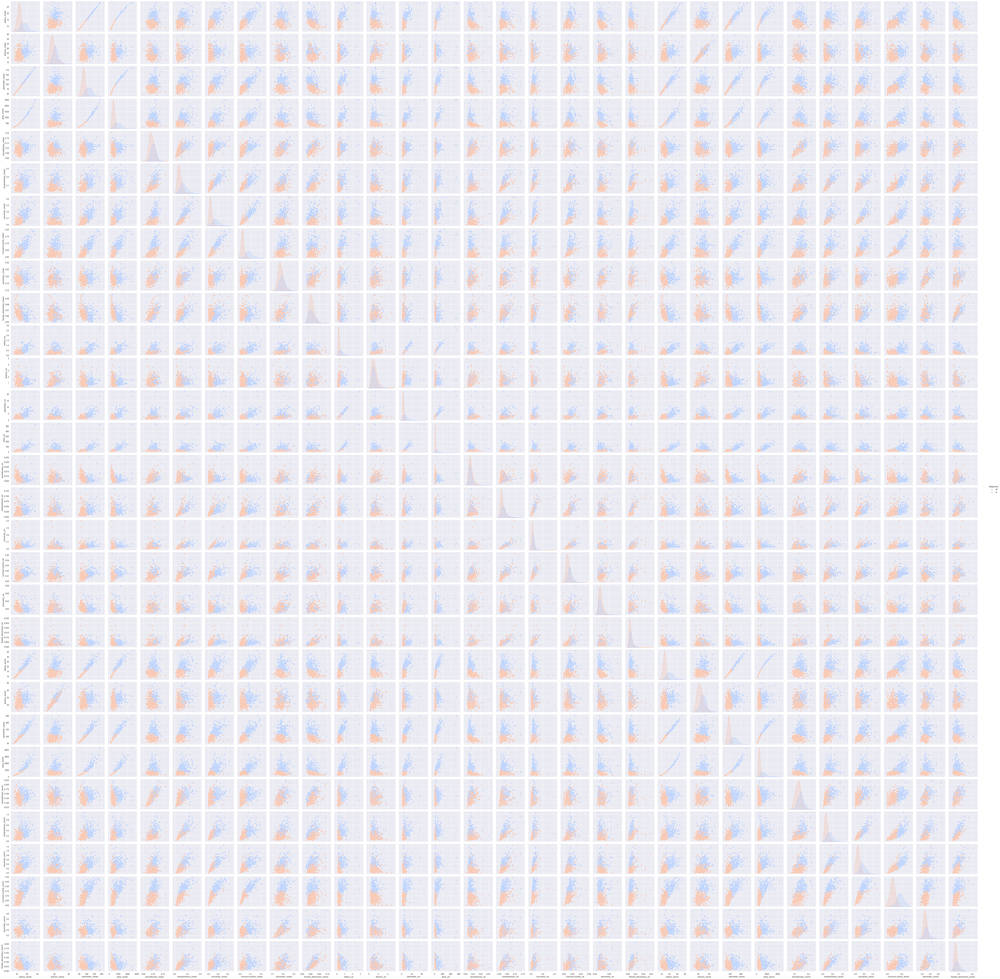

In [12]:
sns.pairplot(df,hue='diagnosis',palette='coolwarm')

<AxesSubplot: >

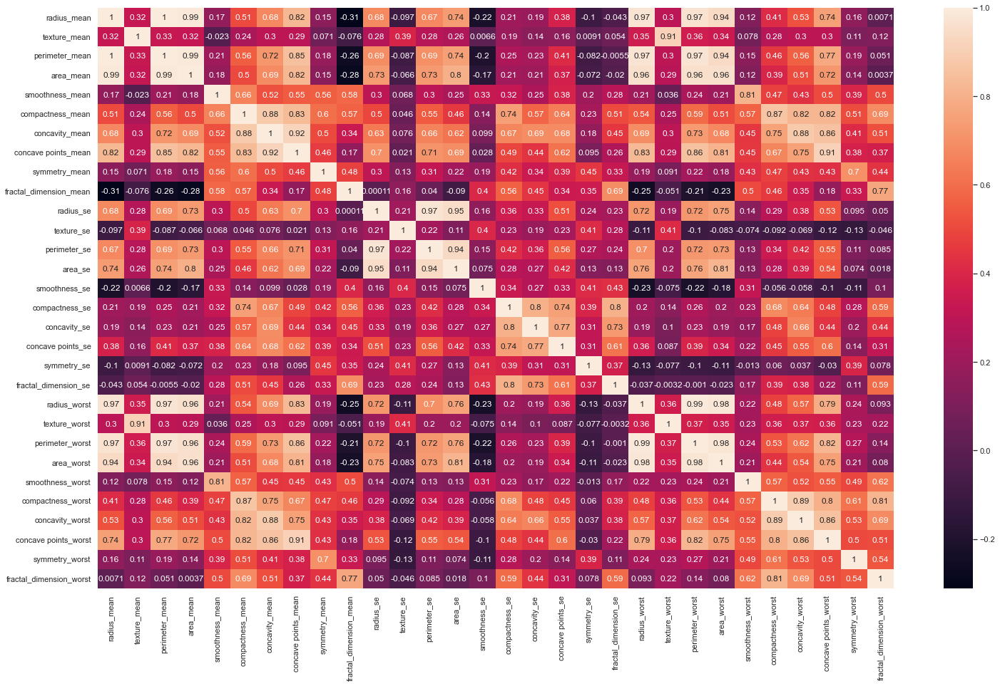

In [21]:
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(),annot=True)

### Data Preprocessing 

In [24]:
scaler = StandardScaler()

In [26]:
scaler.fit(df.drop('diagnosis',axis=1))

StandardScaler()

In [27]:
scaled_features = scaler.transform(df.drop('diagnosis',axis=1))

In [32]:
df_feat = pd.DataFrame(scaled_features,columns=df.columns[1:])

In [33]:
df_feat.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


### Build The Model

In [37]:
X = df_feat
y = df['diagnosis']

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [46]:
knn = KNeighborsClassifier(n_neighbors=1)

In [47]:
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

In [50]:
pred = knn.predict(X_test.values)

In [51]:
pred

array(['B', 'B', 'B', 'M', 'B', 'B', 'B', 'M', 'B', 'B', 'M', 'B', 'B',
       'B', 'M', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'M', 'B',
       'M', 'B', 'M', 'M', 'M', 'M', 'B', 'M', 'B', 'B', 'M', 'M', 'M',
       'M', 'M', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'M', 'B', 'M', 'B',
       'B', 'M', 'B', 'B', 'M', 'M', 'B', 'B', 'M', 'B', 'B', 'B', 'M',
       'B', 'B', 'M', 'M', 'B', 'M', 'B', 'B', 'B', 'M', 'M', 'B', 'M',
       'M', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'M', 'B', 'B',
       'M', 'M', 'B', 'B', 'B', 'B', 'B', 'M', 'M', 'M', 'B', 'B', 'B',
       'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'B',
       'M', 'M', 'M', 'M', 'M', 'M', 'B', 'B', 'B', 'B', 'B', 'B', 'B',
       'M', 'M', 'B', 'B', 'B', 'B', 'M', 'M', 'M', 'B', 'M', 'B', 'M',
       'B', 'B', 'B', 'M', 'B', 'B', 'B', 'B', 'M', 'M', 'M', 'B', 'M',
       'B', 'M', 'B', 'B', 'M', 'B', 'B', 'M', 'M', 'B', 'B', 'B', 'B',
       'M', 'B'], dtype=object)

### Evaluate The Model

In [52]:
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           B       0.97      0.95      0.96       107
           M       0.92      0.95      0.94        64

    accuracy                           0.95       171
   macro avg       0.95      0.95      0.95       171
weighted avg       0.95      0.95      0.95       171



In [53]:
print(confusion_matrix(pred, y_test))

[[102   5]
 [  3  61]]


In [55]:
error_rate = []

for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    predict_i = knn.predict(X_test.values)
    error_rate.append(np.mean(predict_i != y_test))

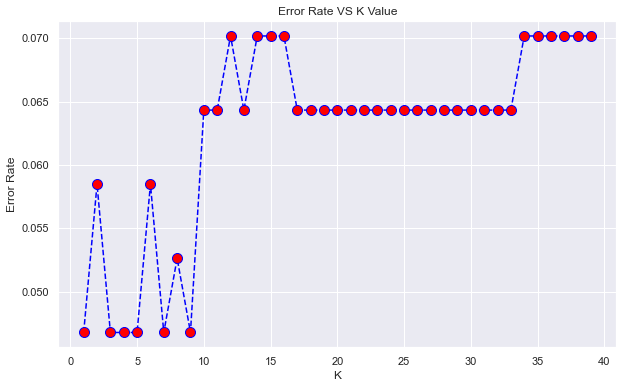

In [56]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue',linestyle='dashed',marker='o',markerfacecolor='red',markersize=10)
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.title('Error Rate VS K Value')
plt.show()

### Retrain The Model 

In [59]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train,y_train)
pred = knn.predict(X_test.values)

In [60]:
print(classification_report(pred,y_test))

              precision    recall  f1-score   support

           B       0.98      0.94      0.96       109
           M       0.91      0.97      0.94        62

    accuracy                           0.95       171
   macro avg       0.95      0.96      0.95       171
weighted avg       0.95      0.95      0.95       171



In [61]:
print(confusion_matrix(pred, y_test))

[[103   6]
 [  2  60]]
